In [2]:
import numpy as np 
import pandas as pd
import email
import json

from collections import Counter
import matplotlib.pyplot as plt

import string
import re

# Load CSV Data

In [3]:
df = pd.read_csv("./emails.csv", error_bad_lines=False, warn_bad_lines=True)
df.head()

C:\Users\Andor\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\Andor\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)


,file,message
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...


In [4]:
print(df.loc[1]['message'])

Message-ID: <15464986.1075855378456.JavaMail.evans@thyme>
Date: Fri, 4 May 2001 13:51:00 -0700 (PDT)
From: phillip.allen@enron.com
To: john.lavorato@enron.com
Subject: Re:
Mime-Version: 1.0
Content-Type: text/plain; charset=us-ascii
Content-Transfer-Encoding: 7bit
X-From: Phillip K Allen
X-To: John J Lavorato <John J Lavorato/ENRON@enronXgate@ENRON>
X-cc: 
X-bcc: 
X-Folder: \Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Sent Mail
X-Origin: Allen-P
X-FileName: pallen (Non-Privileged).pst

Traveling to have a business meeting takes the fun out of the trip.  Especially if you have to prepare a presentation.  I would suggest holding the business plan meetings here then take a trip without any formal business meetings.  I would even try and get some honest opinions on whether a trip is even desired or necessary.

As far as the business meetings, I think it would be more productive to try and stimulate discussions across the different groups about what is working and what is not.  Too often the

# Extract Text and Folder

In [5]:
message = df.loc[1]['message']
e = email.message_from_string(message)

In [6]:
def get_field(field, messages):
    column = []
    for message in messages:
        e = email.message_from_string(message)
        column.append(e.get(field))
    return column
df['folder'] = get_field("X-Folder", df['message'])

In [7]:
def body(messages):
    column = []
    for message in messages:
        e = email.message_from_string(message)
        column.append(e.get_payload())
    return column

df['text'] = body(df['message'])

In [8]:
cols_to_drop = ['file','message']
df.drop(cols_to_drop, axis=1, inplace=True)
df.head()

,folder,text
0,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Here is our forecast\n\n
1,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Traveling to have a business meeting takes the...
2,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,test successful. way to go!!!
3,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,"Randy,\n\n Can you send me a schedule of the s..."
4,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Let's shoot for Tuesday at 11:45.


# Clean Data

## Preprocess X-Folder

In [9]:
def preprocess_folder(folders):
    column = []
    for folder in folders:
        if (folder is None or folder == ""):
            column.append(np.nan)
        else:
            column.append(folder.split("\\")[-1].lower())
    return column

df['folder'] = preprocess_folder(df['folder'])
df.head()

,folder,text
0,'sent mail,Here is our forecast\n\n
1,'sent mail,Traveling to have a business meeting takes the...
2,'sent mail,test successful. way to go!!!
3,'sent mail,"Randy,\n\n Can you send me a schedule of the s..."
4,'sent mail,Let's shoot for Tuesday at 11:45.


In [10]:
# count unique folders and check for missing values
print("Unique Folders: ", len(df['folder'].unique()))
print("Missing values in fields :")
print(df.isnull().sum())

Unique Folders:  1782
Missing values in fields :
folder    29
text       0
dtype: int64


In [11]:
# Drop items with missing values
df.dropna(axis=0, inplace=True)
print("Missing values in fields :")
print(df.isnull().sum())

Missing values in fields :
folder    0
text      0
dtype: int64


## Select Folders with n>100

In [12]:
df['folder'].value_counts()

all documents         128103
discussion threads     58609
sent                   58168
deleted items          50987
inbox                  41507
                       ...  
ubsw online                1
synfuel                    1
astra                      1
conoco                     1
clean fuels                1
Name: folder, Length: 1781, dtype: int64

In [13]:
# Get the count of each value
value_counts = df['folder'].value_counts()

# Select the values where the count is less than 100
to_remove = value_counts[value_counts <= 100].index

# Keep rows where the city column is not in to_remove
df = df[~df['folder'].isin(to_remove)]

In [14]:
pd.set_option('display.max_rows', 130)
print(df['folder'].value_counts())

all documents                    128103
discussion threads                58609
sent                              58168
deleted items                     50987
inbox                             41507
sent items                        37920
notes inbox                       36665
'sent mail                        30237
untitled                           8957
personal                           2642
attachments                        2026
meetings                           1872
calendar                           1732
schedule crawler                   1398
logistics                          1192
tw-commercial group                1159
california                         1052
bill williams iii                  1022
deal discrepancies                  897
management                          802
esvl                                715
e-mail bin                          614
tufco                               609
resumes                             609
ces                                 576


In [15]:
df.shape

(492788, 2)

## Select Specific Folders for Classification

In [16]:
df = df[df.folder.eq('logistics') | df.folder.eq('personal') | df.folder.eq('deal discrepancies') | df.folder.eq('management') | df.folder.eq('resumes') | df.folder.eq('online trading') | df.folder.eq('corporate comm') | df.folder.eq('corporate') | df.folder.eq('corp info_announcements')]

In [19]:
df.loc[df["folder"] == "corporate", "folder"] = "corp"
df.loc[df["folder"] == "corporate comm", "folder"] = "corp"
df.loc[df["folder"] == "corp info_announcements", "folder"] = "corp"

In [20]:
print(df['folder'].value_counts())

personal              2642
logistics             1192
deal discrepancies     897
management             802
corp                   786
resumes                609
online trading         573
Name: folder, dtype: int64


## Preprocess Text

In [21]:
# Print mail entries from selected folder
def printblogs(emails, cleaned):
    if cleaned:
        for email in emails['cleaned_text']:
            print(email,'\n')
    else:
        for email in emails['text']:
            print(email,'\n')

In [24]:
select_topic = df.loc[df['folder'] == 'personal']
printblogs(select_topic, False)

Dear JENNIFER S MEDCALF,

Thank you for your order. We are currently reviewing for completeness and 
accuracy.
A separate email with your Dell Order number(s) will be sent to you after the 
order is processed.

A recap of your order is provided at the end of this message for your 
reference.
We encourage you to verify, print, and retain the information on this page 
for your records.

Date Submitted: 12/13/00 10:51:00 AM



If at any time you have questions regarding your order please contact your 
Dell Sales Representative:

Name:  EPP Sales
Email: US_EPP_Clickathome@dell.com
Phone: 866-220-3355


Again, thank you for your order. We appreciate you buying from Dell and using 
your Dell Premier Pages Service.

Sincerely,
Dell Premier Pages Service

Shopping cart includes 1 unique item(s)
Total Price: $547.00

Item Detail#:1
Dell Inspiron 3800 Notebook--Intel&#174; Celeron&#153; processor, 600 MHz, 
12.1" SVGA Display

Memory:                                  64MB, SDRAM, 1 DIMM
Color Ch

 

Dear Mr. Kaminski,

This is to inform you that your "Public Utilities Fortnightly" On-line
subscription is now ready for your use.  This on-line service is good for 30
days.

        User name  -  2000208
        Password   -  quality

Thank you.

Janet Clark
Customer Service Rep 

The following SAP ID and Password allows you to access pay, benefit, and 
personal data via eHROnline.  Do NOT provide this ID/Password to anyone as it 
enables modification to direct deposit account information.

The SAP system AND eHROnline will be available beginning 
FRIDAY, JUNE 23 at 8:00 AM for TIME ENTRY.  
Full SAP functionality for financials will be available on July 5, 2000.



You will be asked to change your password at the initial logon.  Your NEW 
password should meet the following criteria:
Must be 6-8 characters long
Can include numbers and letters
Can NOT include 'enron' in your password.
The system will require you to change your password every 90 days.


The following address will con

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [26]:
df['cleaned_text'] = [x.replace('\n',' ') for x in df['text']]
df['cleaned_text'] = [x.replace('\t',' ') for x in df['text']]

In [27]:
select_topic = df.loc[df['folder'] == 'personal']
printblogs(select_topic, True)

Dear JENNIFER S MEDCALF,  Thank you for your order. We are currently reviewing for completeness and  accuracy. A separate email with your Dell Order number(s) will be sent to you after the  order is processed.  A recap of your order is provided at the end of this message for your  reference. We encourage you to verify, print, and retain the information on this page  for your records.  Date Submitted: 12/13/00 10:51:00 AM    If at any time you have questions regarding your order please contact your  Dell Sales Representative:  Name:  EPP Sales Email: US_EPP_Clickathome@dell.com Phone: 866-220-3355   Again, thank you for your order. We appreciate you buying from Dell and using  your Dell Premier Pages Service.  Sincerely, Dell Premier Pages Service  Shopping cart includes 1 unique item(s) Total Price: $547.00  Item Detail#:1 Dell Inspiron 3800 Notebook--Intel&#174; Celeron&#153; processor, 600 MHz,  12.1" SVGA Display  Memory:                                  64MB, SDRAM, 1 DIMM Color Ch

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





 A very nice note and a very nice gesture.  By the way, none of my anger is = directed toward you or anybody in our group.  You've always handled the goo= d times with dignity and compassion, and you're handling the bad times equa= lly well.  If only there were more people with your integrity and drive for=  personal excellence at the top of this organization....    -----Original Message----- From: =09Dernehl, Ginger   On Behalf Of Shapiro, Richard Sent:=09Wednesday, October 31, 2001 8:03 AM To:=09Alamo, Joseph; Allegretti, Daniel; Allen, Joe; Alvarez, Ramon; Ausenh= us, Kara; Barnes, Lynnette; Bellas, Kirsten; Binns, Darran; Bolton, Scott; = Boston, Roy; Buerger, Rubena; Burns, Stephen; Canovas, Guillermo; Cantrell,=  Rebecca W.; Comnes, Alan; Connor, Joe; Cooney, Carolyn; Dasovich, Jeff; De= cker, Larry; Dernehl, Ginger; Dressler, Jean; Floris, Vinio; Frank, Robert;=  Fromer, Howard; Fulton, Donna; Gottfredson, Bryan; Guerrero, Janel; Hamilt= on, Allison; Hardy Jr, John; Hartfield,

In [29]:
df.shape

(7501, 3)

# Create Train-Test Split

In [32]:
def draw_label_distribution(input_labels, datasplit):
    labels = []
    for label in input_labels:
        labels.append(label)
    unique_labels = list(Counter(labels).keys())
    print("Number of unique labels: ",len(unique_labels))
    label_count = list(Counter(labels).values())
    label_count.sort(reverse=True)
    x = np.array(unique_labels)
    y = np.array(label_count)

    f, ax = plt.subplots(figsize=(8, 10))
    plt.bar(unique_labels, label_count)
    plt.yscale('log')
    plt.xticks([])
    plt.yticks(fontsize=18)
    plt.ylabel("# of occurrences in logarithmic scale", fontsize=18)
    plt.xlabel("Labels", fontsize=18)
    plt.tight_layout()
    plt.savefig(datasplit)

Number of unique labels:  7


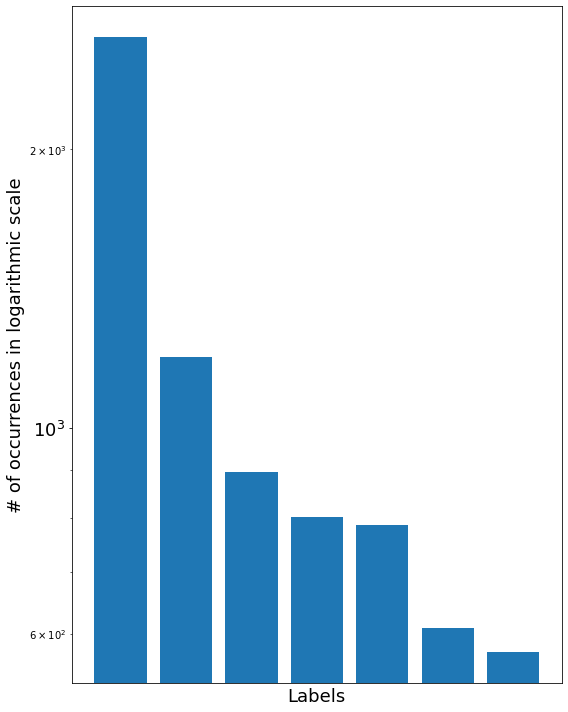

In [33]:
# Draw full data label distribution
draw_label_distribution(df['folder'], "full_label_dist")

In [34]:
from sklearn.model_selection import train_test_split

X = df['cleaned_text']
y = df['folder']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2)
print(X_train.shape)

(6000,)


Number of unique labels:  7


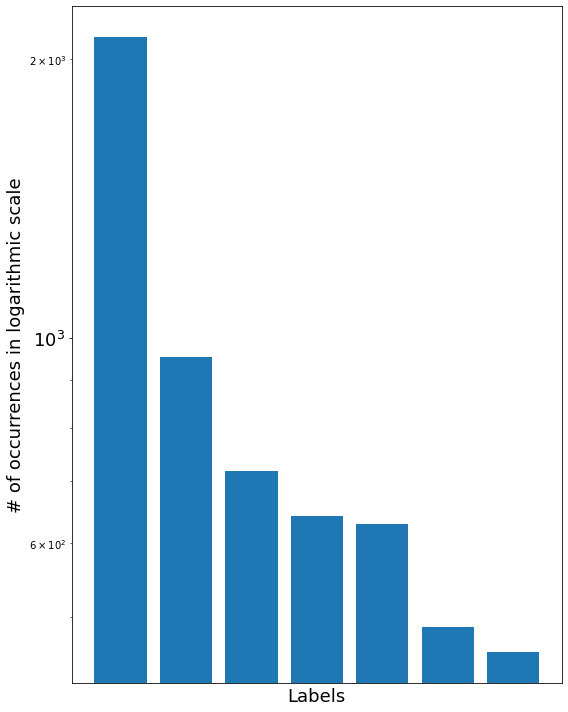

In [35]:
# Draw training data label distribution
draw_label_distribution(y_train, "train_label_dist")

Number of unique labels:  7


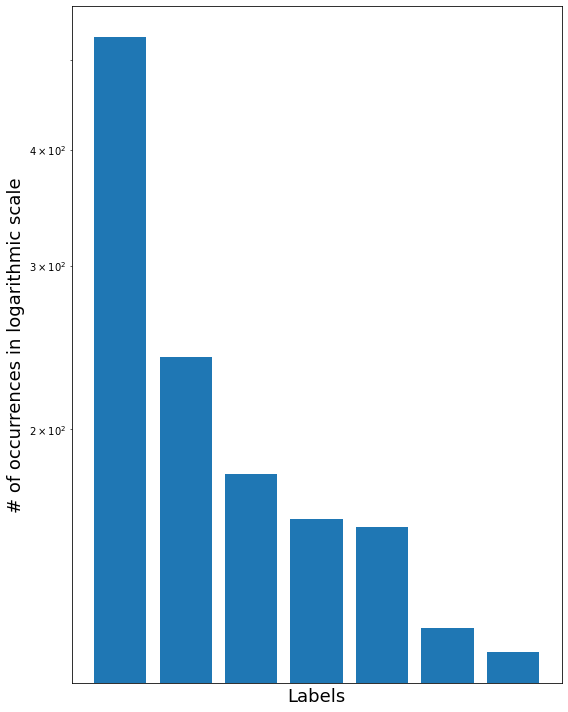

In [36]:
# Draw test data label distribution
draw_label_distribution(y_test, "test_label_dist")

# Save to JSON

In [37]:
df_train = X_train.to_frame().join(y_train)
df_test = X_test.to_frame().join(y_test)

train_json = df_train.to_json(orient="records")
train_json_parsed = json.loads(train_json)

with open('train_data.json', 'w') as outfile:
    json.dump(train_json_parsed, outfile)

test_json = df_test.to_json(orient="records")
test_json_parsed = json.loads(test_json)

with open('test_data.json', 'w') as outfile:
    json.dump(test_json_parsed, outfile)

In [38]:
test_list = json.load(open("test_data.json",))
test_data = np.array(list(map(lambda x: list(x.values())[:1], test_list)),dtype=object)
test_labels = np.array(list(map(lambda x: list(x.values())[1], test_list)),dtype=object)
print(len(test_data))
print(len(test_labels))

train_list = json.load(open("train_data.json",))
train_data = np.array(list(map(lambda x: list(x.values())[:1], train_list)),dtype=object)
train_labels = np.array(list(map(lambda x: list(x.values())[1], train_list)),dtype=object)
print(len(train_data))
print(len(train_labels))

1501
1501
6000
6000


# Count Entitites in selected folders

In [20]:
import spacy

nlp = spacy.load("en_core_web_sm")
doc = nlp(df.loc[2]['text'])
for ent in doc.ents:
    print(ent.label_)

In [21]:
pd.options.display.max_colwidth = 200
def printmails(mails):
    for mail in mails['text']:
        print(mail,'\n')
        
def printents(mails):
    arr =[]
    for mail in mails['text']:
        doc= nlp(mail)
        for ent in doc.ents:
            arr.append(ent.label_)
    #print(arr)
    my_dict = {i:arr.count(i) for i in arr}
    print(my_dict)

In [22]:
select_folder = df.loc[df['X-Folder'] == 'personal']
printmails(select_folder)

Dear JENNIFER S MEDCALF,  Thank you for your order. We are currently reviewing for completeness and  accuracy. A separate email with your Dell Order number(s) will be sent to you after the  order is processed.  A recap of your order is provided at the end of this message for your  reference. We encourage you to verify, print, and retain the information on this page  for your records.  Date Submitted: 12/13/00 10:51:00 AM    If at any time you have questions regarding your order please contact your  Dell Sales Representative:  Name:  EPP Sales Email: US_EPP_Clickathome@dell.com Phone: 866-220-3355   Again, thank you for your order. We appreciate you buying from Dell and using  your Dell Premier Pages Service.  Sincerely, Dell Premier Pages Service  Shopping cart includes 1 unique item(s) Total Price: $547.00  Item Detail#:1 Dell Inspiron 3800 Notebook--Intel&#174; Celeron&#153; processor, 600 MHz,  12.1" SVGA Display  Memory:                                  64MB, SDRAM, 1 DIMM Color Ch


You have been added to Transwestern Pipeline Company.  Jason Moore       Kevin Hyatt@ENRON 01/26/2001 04:55 PM To: Jason Moore/HOU/ECT@ECT cc:   Subject: Re: Global Counterparty Trader ID     Jason, my ID is khyatt thanks Kevin x35559     Jason Moore@ECT 01/26/2001 10:20 AM To: Michelle Lokay/ET&S/Enron@ENRON cc: Kevin Hyatt/ET&S/Enron@Enron, Lorraine Lindberg/ET&S/Enron@ENRON, Jeffery Fawcett/ET&S/Enron@ENRON, TK Lohman/ET&S/Enron@ENRON  Subject: Re: Global Counterparty Trader ID     You have been added to Transwestern Pipeline Company.  Jason Moore          Enron North America Corp.  From:  Michelle Lokay @ ENRON                           01/24/2001 02:17 PM       To: Jason Moore/HOU/ECT@ECT cc: Kevin Hyatt/ET&S/Enron@Enron, Lorraine Lindberg/ET&S/Enron@ENRON, Jeffery Fawcett/ET&S/Enron@ENRON, TK Lohman/ET&S/Enron@ENRON  Subject: Global Counterparty Trader ID     Please set up the following people with "trader" status under Transwestern Pipeline Company.  We will be using Enron On L

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 

Bill,  How's your day going? You seem busy and/or pre-occupied. Do you still wanna go get some coffee? If you are too busy, don't worry about it. I just need to drink some coffee whether it is here or there...  bye 



In [23]:
printents(select_folder)

{'ORG': 13130, 'CARDINAL': 6650, 'LAW': 83, 'PERSON': 13297, 'MONEY': 1732, 'DATE': 7550, 'WORK_OF_ART': 1013, 'TIME': 2424, 'QUANTITY': 136, 'PRODUCT': 601, 'PERCENT': 329, 'LOC': 258, 'GPE': 5793, 'FAC': 306, 'ORDINAL': 620, 'NORP': 730, 'EVENT': 143, 'LANGUAGE': 35}


In [42]:
nlp = spacy.load("en_core_web_sm")
nlp.get_pipe("ner").labels

('CARDINAL',
 'DATE',
 'EVENT',
 'FAC',
 'GPE',
 'LANGUAGE',
 'LAW',
 'LOC',
 'MONEY',
 'NORP',
 'ORDINAL',
 'ORG',
 'PERCENT',
 'PERSON',
 'PRODUCT',
 'QUANTITY',
 'TIME',
 'WORK_OF_ART')

In [24]:
select_folder = df.loc[df['X-Folder'] == 'logistics']
printmails(select_folder)

Mark:  Here is a list of the 66 physical deals that were zeroed out from December 15 onwards  las night. There were also many financial deals that were killed, but I hope that does not matter to Unify.       -----Original Message----- From:  Mcclure, Mark   Sent: Thursday, December 13, 2001 5:11 PM To: Jaquet, Tammy; Krishnaswamy, Jayant Cc: Pena, Matt; Superty, Robert; Wynne, Rita; Pinion, Richard; Farmer, Daren J.; Heal, Kevin; Kinsey, Lisa; Lamadrid, Victor; Smith, George F.; Sullivan, Patti Subject: RE: Killing ENA to ENA deals in Sitara   Jay,  Let's not assume what impact this will have. Even though it is better to zero out deals we(VM) wouldn't want to go in and zero out 2000 deals.   We do have a few questions.  I would like to discuss what minimal impact is? How do you know what impact this will have? Is there a reason this will have little impact? Do all of these D2D deals have zero volume associated with them? Who decided to do this? Why are we doing this? What time span are

I have re-checked Sitara & verified that the above deal was a Term, Firm deal.  This resulted in a GTC Purchase Firm contract being set-up in the Global Contracts System.  The term of the GTC was set as the term of the deal (4/1/00 thru 3/31/01) with no evergreen, meaning that the contract will expire at the end of this month.  To the best of my knowledge, all GTC Purchase Firms have the same language & they do not have evergreen.  They expire at the end of the primary term.  So, unless Exxon negotiated a deal with different, special language to allow for evergreen & included something about a "10 day notification" to terminate, there isn't any reason to "terminate" this contract.  If this is the case, please advise.  Otherwise, I don't think we need to do anything.  The contract will expire at the end of this month on its own.       Elsa Villarreal 03/15/2001 02:42 PM To: Amelia Alland/HOU/ECT@ECT, Cheryl Dudley/HOU/ECT@ECT cc: Daren J Farmer/HOU/ECT@ECT  Subject: Exxon Company, USA G

Daren:  I have been informed that this meter has been disconnected.  The 215 has a  nom of 74/day at this meter.  The first day I have a -0- flow is 2/12/00.  Let me know if you have other information.  Thanks!  Charlotte 

Aimee/George:   Per Daren, we have a purchase deal at meter 9769, but the allocation is  nomed on the PG&E contract.  Could you please verify with Brian if this is  truely their gas or ours?  Thanks  Thu    

Daren you are correct in that this was only in MOPS for the 26th.  It was  edi'd over to POPS from the 25th through the 31st populating all days with  the 16,700 nom.  The nom was never -0- out in POPS therefore the change  notification process in POPS did not pick up a change at this meter.  This  meter is pathed by Kim and confirmed by me - it is extremely odd that this  was missed in MOPS.  The record would have been out of balance and someone,  if not several people, normally would make a comment on this.   Also  -  all  of my records indicate that the 16,7

In [25]:
printents(select_folder)

{'CARDINAL': 2996, 'DATE': 4194, 'GPE': 1299, 'ORG': 4861, 'PERSON': 7365, 'WORK_OF_ART': 248, 'TIME': 1663, 'NORP': 116, 'ORDINAL': 166, 'LOC': 67, 'PRODUCT': 234, 'MONEY': 431, 'PERCENT': 118, 'QUANTITY': 65, 'FAC': 63, 'LAW': 37, 'EVENT': 26}


In [26]:
select_folder = df.loc[df['X-Folder'] == 'management']
printmails(select_folder)

Vince,  I am planning to make my resignation from Enron so that June 5th would be my last day at work.   I am interested in the trading opportunity this fall and will talk again with Andy about it.    It will still make sense for me to resign in the mean time in order that I may start burning my non-compete period to open up my other options.   In addition, it  will allow me to be rehired without the burden of the noncompete should I come back in the fall.  Regards,  Stinson 

Hi Nalin,   Martin Lin asked if you have a paper "or something" related to the lecture you will be giving to us on May 17th.  Ciao, Iris   -----Original Message----- From:  Lin, Martin   Sent: Monday, April 30, 2001 8:52 AM To: Mack, Iris Subject: Re: FW: FW: visit to Enron by Professor Nalin Kulatilaka of Boston  University  Is there a paper or something related to this topic that we can look over beforehand?  Thanks, Martin        Iris Mack/ENRON@enronXgate 04/27/01 05:42 PM     To: Chonawee Supatgiat/Corp/Enro

Siva,     I will have to check and see if we can accomodate a 5 day 8 to 5  class.    Also, President's day is a holiday for us, so we may have to look  at a later date.    --Stinson      "Siva Thiagarajan" <siva@durasoftcorp.com> on 01/29/2001 08:51:02 AM To: <Stinson.Gibner@enron.com> cc:   Subject: Re: DuraSoft -- Java Class   Stinson,  I have attached a file along with this email that lists the software needed for our Java class.  We would like to do the class from Monday thru Friday, 8 AM to 5 PM.  That way we can complete the class within a  week.  We are unable to offer classes in the evenings or for few hours a week. We usually teach week long courses for our other clients and because of that  we won't be available.  Currently, we can do the class from Feb. 19th through Feb. 23 (that is if you are working on Feb 19th, President's day).  I will call  you sometime this afternoon to talk further.  Please feel free to reach me if you have any further questions in the mean time.  Re

In [27]:
printents(select_folder)

{'ORG': 3247, 'DATE': 2022, 'PERSON': 5669, 'TIME': 1220, 'WORK_OF_ART': 326, 'GPE': 780, 'PERCENT': 90, 'CARDINAL': 1272, 'NORP': 86, 'PRODUCT': 218, 'ORDINAL': 166, 'FAC': 34, 'MONEY': 233, 'EVENT': 23, 'LOC': 48, 'LAW': 38, 'LANGUAGE': 8, 'QUANTITY': 17}


In [28]:
select_folder = df.loc[df['X-Folder'] == 'resumes']
printmails(select_folder)

Sally,  Thanks for taking the time to meet with me today and telling me about the exciting opportunities you have at North America.  I reviewed the presentation that you  gave me and found myself already thinking about how to make it happen.  I would very much like to work with you to make this a reality.  Attached is a copy of my resume.  I look forward to continuing our discussions next week.     Gay   Gay Mayeux Vice President, Enron Broadband Services Physical Location:  1400 Smith Street EB4620                                       Houston, TX 77002 Email:  gay_mayeux@enron.net Office: (713) 853-9905 Cell:     (713) 416-8821 Fax:     (713) 646-5737 

Toni -  Sally suggested I forward this resume to you.  Jasmine got in touch with me  through a mutual friend.  I don't know much about her business potential or  past performance.  She is currently a contract employee at El Paso and is  concerned that with the Coastal merger, she will be out of a job.  On a completely selfish note, I 

In [29]:
printents(select_folder)

{'PERSON': 3933, 'DATE': 1846, 'LOC': 30, 'ORG': 2575, 'CARDINAL': 1011, 'FAC': 39, 'GPE': 756, 'PERCENT': 10, 'MONEY': 64, 'TIME': 1153, 'WORK_OF_ART': 227, 'ORDINAL': 124, 'PRODUCT': 108, 'NORP': 49, 'LAW': 10, 'LANGUAGE': 1, 'EVENT': 9}


In [30]:
select_folder = df.loc[df['X-Folder'] == 'online trading']
printmails(select_folder)

Attached are ClickPaper approvals for December 7, 2000.  

Attached please find an addendum to today's approvals (includes Times Mirror  Magazines Inc. for a $0 threshold).  

Tana:  1. None of the following CPs are authorized to trade US power products:  a) The following were restricted by credit:  HS Energy Services, Inc. TransTexas Gas Corporation Adair International Oil and Gas, Inc. Cooperative Refining LLC Pen Coal Corporation  b) The following are not current CPs/not FERC approved:  Shell Capital Inc.  Waste Management, Inc.  2.  British Columbia Powre Exchange Corporation is authorized to trade US  West power products, but it is NOT authorized to trade US East power products.  Leslie 

I think the original was encrypted.  ---------------------- Forwarded by Michelle Bruce/HOU/ECT on 07/26/2000  08:11 AM ---------------------------   Michelle Bruce 07/26/2000 08:10 AM To: Tana Jones/HOU/ECT@ECT, Camille Gerard/ET&S/Enron@ENRON, Jarrod  Cyprow/HOU/ECT@ECT cc:   Subject: New Click

In [31]:
printents(select_folder)

{'ORG': 2982, 'DATE': 539, 'MONEY': 33, 'CARDINAL': 882, 'GPE': 890, 'PERSON': 2979, 'TIME': 378, 'WORK_OF_ART': 118, 'LOC': 69, 'NORP': 145, 'PERCENT': 17, 'PRODUCT': 47, 'ORDINAL': 86, 'FAC': 19, 'LAW': 29, 'EVENT': 15, 'QUANTITY': 6, 'LANGUAGE': 11}


In [32]:
select_folder = df.loc[df['X-Folder'] == 'corporate']
printmails(select_folder)

Join Bill Donovan on eSpeak at ethink.enron.com, Tuesday, June 6 at 10 a.m.  Houston time.  Bill, vice president of Enron Property Services Operations,  will conduct an "open mike" session on the new Enron building in Houston.  Are you at a remote location or can't make the event? Go into eSpeak now and  pre-submit your question(s) for Bill to answer during the scheduled event.   We want to answer everyone's questions, but due to the high volume of  questions we anticipate on this session, it would be helpful if you can keep  your questions short and simple.  This will increase the opportunity for your  question to be answered.  eThink: Invest Your Mind 

Mark Your Lunch Calendars!  You are invited to attend the ENA Brown Bag Lunch Series  Featuring Brian Redmond Managing Director=20  Discussion Topic:  ENA Upstream  Wednesday, June 21, 2000 11:30 AM =01) 12:30 PM EB 5C2    You bring your lunch -     Limited Seating We provide drinks and dessert!    RSVP  X 57352   

The 2000 Chairman'

In [33]:
printents(select_folder)

{'PERSON': 2202, 'ORG': 4359, 'DATE': 2021, 'TIME': 442, 'GPE': 859, 'FAC': 129, 'WORK_OF_ART': 248, 'PERCENT': 234, 'MONEY': 371, 'CARDINAL': 1978, 'ORDINAL': 144, 'QUANTITY': 26, 'NORP': 107, 'EVENT': 66, 'PRODUCT': 105, 'LOC': 106, 'LAW': 30, 'LANGUAGE': 1}


In [34]:
select_folder = df.loc[df['X-Folder'] == 'corporate comm']
printmails(select_folder)

That's right.  The much-anticipated and ballyhooed ThinkBank is here at last!  Got an idea you want to share?  Make a deposit in the Idea Vault.    Looking for some inspiration to get you moving on a project?  Check out  Resources.    Interested in new techniques to help you do your job?   See what Good Sense  has to offer.  It's all in the ThinkBank on eThink.  Stop by today. 

Attached is a copy of a letter which we are sending to our Corporate, Enron= =20 North America Corp., Enron Energy Services Operations, Inc., Enron Broadban= d=20 Services, Inc., Enron Net Works, LLC, Enron Engineering and Construction=20 Company, EGEP Services, Inc., Enron Transportation Services Company, Enron= =20 Property Services Company, and Portland General Electric Company vendors as= =20 an additional step toward implementing our commitment to conduct our busine= ss=20 affairs in accordance with the highest ethical standards.  We are sending you a copy of this letter so that you will be aware that you=

In [35]:
printents(select_folder)

{'ORG': 2733, 'LOC': 95, 'DATE': 969, 'CARDINAL': 1815, 'WORK_OF_ART': 235, 'PERSON': 2277, 'GPE': 808, 'ORDINAL': 85, 'FAC': 52, 'PRODUCT': 151, 'TIME': 660, 'NORP': 85, 'QUANTITY': 34, 'EVENT': 12, 'MONEY': 96, 'PERCENT': 55, 'LAW': 13, 'LANGUAGE': 2}


In [36]:
select_folder = df.loc[df['X-Folder'] == 'corp info_announcements']
printmails(select_folder)

 As a follow-up to the recent Enron Corp. memorandum forming Enron Wholesale  Services (EWS), effective today, we have reorganized the Wholesale Services  Legal Department.   The goals in reorganizing the department are as follows:  (i) align the  legal department as closely as possible with the business units, (ii) speed  the flow of legal technology across the business units, and (iii) achieve  greater efficiency and consistency across the organization.   To this end, a legal policy group will be formed for EWS Legal, which will  include Lance Schuler, Enron Americas; Mark Evans, Enron Europe; Mark Taylor,  Enron Net Works; Alan Aronowitz, Enron Global Markets; Julia Murray, Enron  Industrial Markets; and Bruce Lundstrom, Enron Global Assets.   The organization chart for the EWS Legal Department is attached.  More  comprehensive organization charts will follow for each group.  Mark Frevert and Mark Haedicke    

Enron Global Markets (EGM) has made numerous organizational changes as i

In [37]:
printents(select_folder)

{'ORG': 1701, 'DATE': 436, 'PERSON': 1363, 'CARDINAL': 1080, 'WORK_OF_ART': 72, 'MONEY': 51, 'GPE': 369, 'PRODUCT': 40, 'LOC': 79, 'NORP': 44, 'TIME': 40, 'ORDINAL': 41, 'PERCENT': 39, 'FAC': 23, 'LAW': 11, 'QUANTITY': 27, 'EVENT': 5, 'LANGUAGE': 1}


In [38]:
select_folder = df.loc[df['X-Folder'] == 'market']
printmails(select_folder)

Les,  ENA's current contract with Southern Co. Services.    Can you forward to John and I the contracts we have with El Paso that you  outlined today? ---------------------- Forwarded by Phil DeMoes/Corp/Enron on 11/30/2000  01:11 PM ---------------------------   Cyndie Balfour-Flanagan 09/13/2000 10:47 AM To: Phil DeMoes/Corp/Enron@ENRON cc:    Subject: Southern Company Services Contract   ---------------------- Forwarded by Cyndie Balfour-Flanagan/Corp/Enron on  09/13/2000 10:45 AM ---------------------------   Cyndie Balfour-Flanagan 09/12/2000 03:05 PM To: Tammi DePaolis/Corp/Enron@ENRON cc:    Subject: Southern Company Services Contract  Attached is the only CES contract with Southern Company Services as "true"  counterparty (listed on the contract instead of having a letter issued later  naming Southern Company Services as Agent). I could not find any specific  deal data; but the contractual provisions should give you what you are  looking for. Please let me know if I can help wi

In [39]:
printents(select_folder)

{'ORG': 764, 'PERSON': 373, 'GPE': 211, 'DATE': 436, 'TIME': 90, 'NORP': 23, 'FAC': 96, 'CARDINAL': 444, 'MONEY': 43, 'PERCENT': 10, 'EVENT': 5, 'WORK_OF_ART': 36, 'PRODUCT': 30, 'ORDINAL': 16, 'LOC': 138, 'QUANTITY': 36, 'LAW': 3}


In [40]:
select_folder = df.loc[df['X-Folder'] == 'deal discrepancies']
printmails(select_folder)

Sean Crandall deal: 453094 error:  Sean with Amerex does not recognize  Diana Scholtes deal: 452697 error: Prebon shows price as $93........enpower has $95   Mark fischer deal: 453278 error:  Prebon shows terms as Dec'00 ......enpower shows 11/9 

453151 the fixed pub code is incorrect, it should be SP-15  

Chris Mallory deal 470094 CP should be Coral Power not Coral Energy Holding L.P. 

Prebon sent over a confirmation for the following trade for Sean Crandall Enron buys from Aquila January  Mid-C 25 mw at $300.00 

Any word yet on this trade?         Kate Symes @ ECT                11/30/2000 05:57 PM  To: Evelyn Metoyer/Corp/Enron@ENRON cc:    Subject: Re: Missing Trade for 11-30-00    Sean and Diana do not recognize this deal. They tried to check with the  brokers, but couldn't get a hold of anyone. I'll let you know first thing in  the morning whether or not this is good and what the deal number is.  Kate    Evelyn Metoyer@ENRON 11/30/2000 03:08 PM To: Kate Symes/PDX/ECT@ECT cc: 


Kate, what's the status?        Kate Symes @ ECT                04/05/2001 05:16 PM  To: Evelyn Metoyer/Corp/Enron@ENRON cc:    Subject: Re: Missing Deal for Mike Swerzbin1    Yep - the trade's there all right. I just talked to Mike again and he said  he'd love to take the trade, but he's sure it's an error. To avoid any  confusion later, and because he's already left the office for today, let's  have Mike talk to his Amerex broker tomorrow morning and clear this up. He  just might get a sweet deal out of it!  Kate    Evelyn Metoyer@ENRON 04/05/2001 03:19 PM To: Kate Symes/PDX/ECT@ECT cc:    Subject: Re: Missing Deal for Mike Swerzbin1     This is what amerex is showing and this is what I have confirmed.         Kate Symes @ ECT                04/05/2001 04:59 PM  To: Evelyn Metoyer/Corp/Enron@ENRON cc:    Subject: Re: Missing Deal for Mike Swerzbin1    Mike did a deal with these terms but a price of 380 - deal is #571917. But he  said a price like $292.50 doesn't sound right for Sept

In [41]:
printents(select_folder)

{'PERSON': 2886, 'DATE': 1101, 'NORP': 76, 'CARDINAL': 1564, 'MONEY': 696, 'PRODUCT': 119, 'ORG': 1585, 'TIME': 803, 'ORDINAL': 58, 'GPE': 220, 'PERCENT': 22, 'FAC': 27, 'LAW': 20, 'WORK_OF_ART': 43, 'LOC': 10, 'QUANTITY': 63, 'EVENT': 6}
